In [3]:
my_factor = ["DEP", "ED", "PI", "MHP", "GDP", "NOI"]

In [6]:
df1

,Unnamed: 0,cbsacode,factor,SAMI,beta,p_value,CI_lower,CI_upper,logY0_hat,n_used,r2
0,0,10100.0,BINGE,0.225270,1.011609,0.000000e+00,1.004052,1.019167,-1.912429,875,0.987509
1,1,10140.0,BINGE,-0.007963,1.011609,0.000000e+00,1.004052,1.019167,-1.912429,875,0.987509
2,2,10180.0,BINGE,0.101105,1.011609,0.000000e+00,1.004052,1.019167,-1.912429,875,0.987509
3,3,10220.0,BINGE,-0.190541,1.011609,0.000000e+00,1.004052,1.019167,-1.912429,875,0.987509
4,4,10300.0,BINGE,-0.004853,1.011609,0.000000e+00,1.004052,1.019167,-1.912429,875,0.987509
...,...,...,...,...,...,...,...,...,...,...,...
25997,25997,49660.0,Park_Area_Acres,-0.816818,1.222287,2.564381e-83,1.111295,1.333280,-6.393230,875,0.348582
25998,25998,49700.0,Park_Area_Acres,-1.627065,1.222287,2.564381e-83,1.111295,1.333280,-6.393230,875,0.348582
25999,25999,49740.0,Park_Area_Acres,-2.498820,1.222287,2.564381e-83,1.111295,1.333280,-6.393230,875,0.348582
26000,26000,49780.0,Park_Area_Acres,2.173774,1.222287,2.564381e-83,1.111295,1.333280,-6.393230,875,0.348582


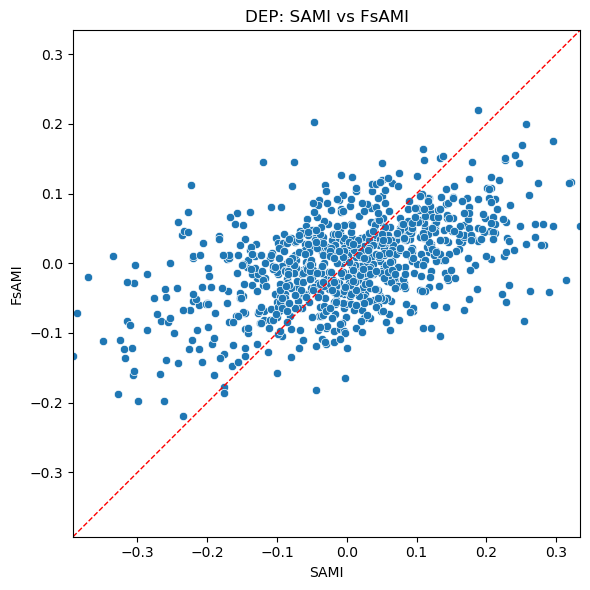

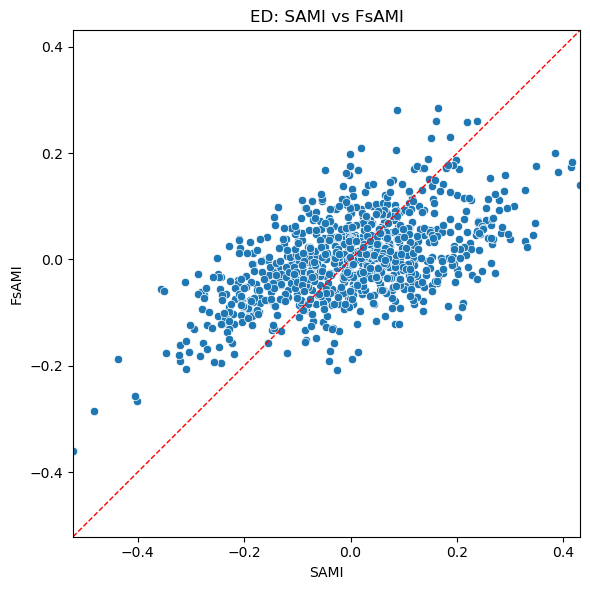

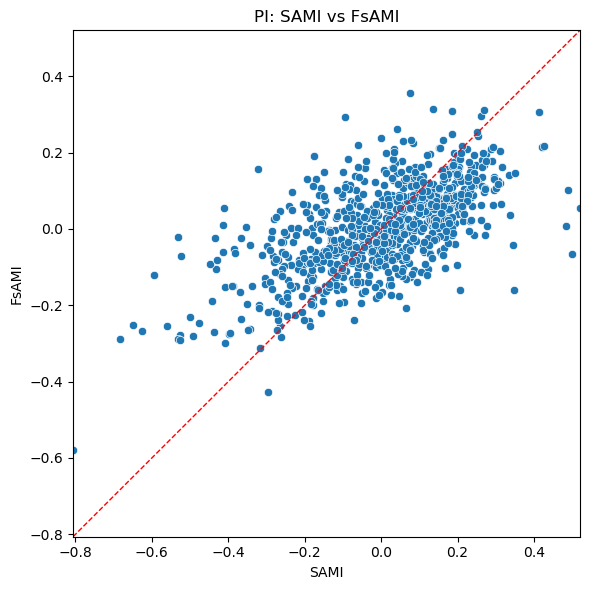

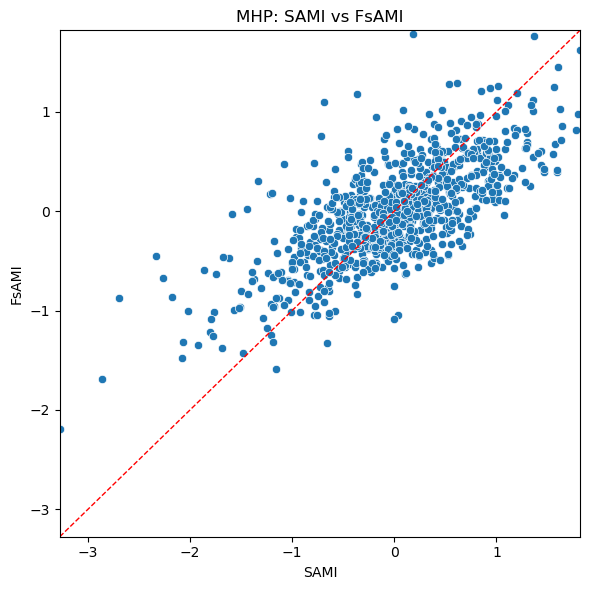

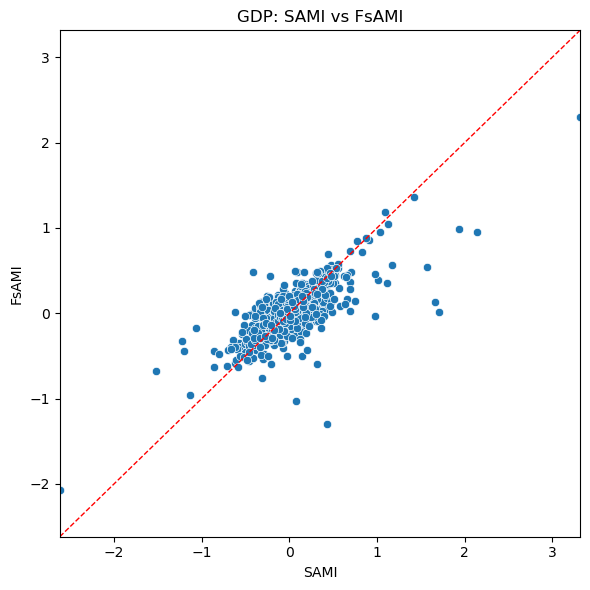

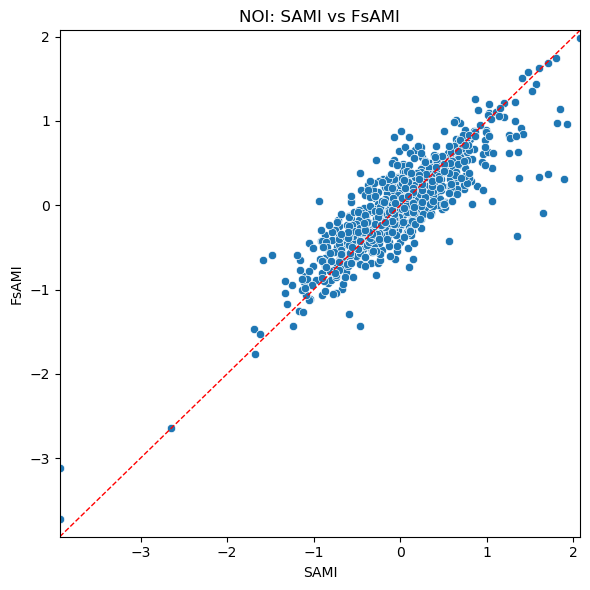

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Paths
m1_path = '../00_data/14_output/SAMIs_pop.csv'          
m2_path = '../00_data/14_output/FsAMIs_0903_pop_ko.csv'
m1_name = 'SAMI'
m2_name = 'FsAMI'

# Load
df1 = pd.read_csv(m1_path)
df2 = pd.read_csv(m2_path)

# Merge on cbsacode + factor
df = pd.merge(df1, df2, on=["cbsacode", "factor"])

df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'
# Suppose you already have your factor list
# Example:
# my_factor = ["GDP", "DEP", "MHP", "NOI", "ED", "FFR", "PI"]

for fac in my_factor:
    dff = df[df["factor"] == fac]

    plt.figure(figsize=(6, 6))
    sns.scatterplot(
        data=dff, 
        x=m1_name, 
        y=m2_name
    )
    vmin = min(dff[m1_name].min(), dff[m2_name].min())
    vmax = max(dff[m1_name].max(), dff[m2_name].max())

    plt.plot([vmin, vmax], [vmin, vmax], "r--", lw=1)  # 1:1 line
    plt.xlim(vmin, vmax)
    plt.ylim(vmin, vmax)


    plt.xlabel(m1_name)
    plt.ylabel(m2_name)
    plt.title(f"{fac}: {m1_name} vs {m2_name}")

    plt.tight_layout()
    plt.show()

## Correlation and Distribution

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\4165514941.py:185: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.92, 1])


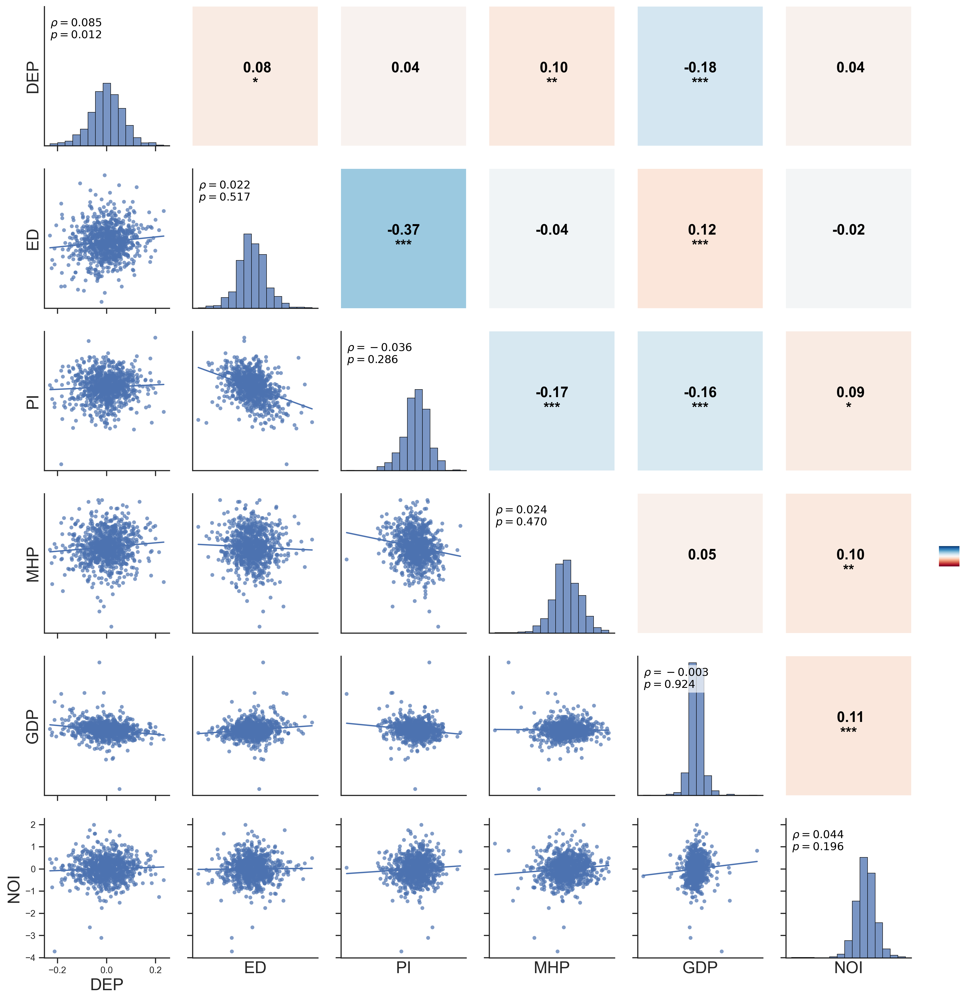

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from scipy.stats import spearmanr

# -----------------------
# INPUTS you already have
# -----------------------
# --- Load & tidy --------------------------------------------------------------

# --- Style --------------------------------------------------------------------
sns.set_theme(style="ticks", font_scale=1.5)
plt.rc("font", family="Arial")
plt.rcParams.update({
    "figure.dpi": 300
})

# --- Marker size mapping (area in points^2) -----------------------------------
pop = df_plot['TotalPopulation']

# Clip extremes and use sqrt scaling for perceptual balance
pop_clip = pop.clip(upper=pop.quantile(0.98))
s_min, s_max = 10, 100  # adjust if you want bigger/smaller bubbles
pop_sqrt = np.sqrt(pop_clip)
sizes_all = s_min + (pop_sqrt - pop_sqrt.min()) / (pop_sqrt.max() - pop_sqrt.min()) * (s_max - s_min)
sizes_all = sizes_all.astype(float)

# -----------------------
# Plot style
# -----------------------
sns.set_theme(style="ticks", font_scale=1.5)
plt.rc("font", family="Arial")
plt.rcParams.update({"figure.dpi": 300})

# -----------------------
# Helpers
# -----------------------
def p_to_stars(p):
    if p < 1e-3:
        return "***"
    elif p < 1e-2:
        return "**"
    elif p < 5e-2:
        return "*"
    return ""

# Upper-triangle: colored cell + rho/p text
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
cmap = plt.get_cmap("RdBu_r")

def map_upper_spearman(x, y, **kws):
    ax = plt.gca()
    # compute Spearman stats
    rho, p = spearmanr(x, y, nan_policy="omit")
    # fill background by correlation strength
    ax.set_facecolor(cmap(norm(np.clip(rho, -1, 1))))
    # big centered text
    txt = f"{rho: .2f}\n{p_to_stars(p)}"
    ax.text(0.5, 0.5, txt, transform=ax.transAxes,
            ha="center", va="center", fontsize=16, color="black", weight="bold")
    # tidy: remove ticks/frames for this cell
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

# Diagonal: distribution (hist)
def map_diag_hist(x, color=None, **kws):
    ax = plt.gca()
    sns.histplot(x, bins=15, edgecolor="black", linewidth=0.5, ax=ax)
    ax.set_ylabel("Count")
    # cleaner look
    ax.grid(False)

    


# Lower-triangle: scatter + linear fit
def map_lower_scatter(x, y, color=None, **kws):
    ax = plt.gca()
    # raw scatter
    sns.scatterplot(x=x, y=y, s=18, alpha=0.7, edgecolor="none", ax=ax)
    # add simple OLS line (no CI)
    sns.regplot(x=x, y=y, scatter=False, ci=None, truncate=True, ax=ax, line_kws={"linewidth": 1.5})
    ax.grid(False)
    
# -----------------------
# Build the PairGrid
# -----------------------
g = sns.PairGrid(
    df_plot[factor_cols],
    vars=factor_cols,
    height=2.6,
    despine=False
)

g.map_upper(map_upper_spearman)
g.map_diag(map_diag_hist)
g.map_lower(map_lower_scatter)

# Cosmetics: align tick labels & titles
for ax in g.axes.flatten():
    if ax is not None:
        ax.tick_params(axis="both", labelsize=10)
        # light frame for lower & diag to mimic the example
        for side in ["top", "right"]:
            if side in ax.spines:
                ax.spines[side].set_visible(False)

# Add a colorbar for rho
# (create a tiny hidden image just to pull a colorbar)
fig = g.fig
cax = fig.add_axes([0.93, 0.12, 0.02, 0.65])  # [left, bottom, width, height]
dummy = np.array([[-1, 1]])
im = plt.imshow(dummy, cmap=cmap, norm=norm)
plt.gca().axis("off")
cb = fig.colorbar(im, cax=cax)
cb.set_label("Spearman ρ", rotation=90)

fig.tight_layout(rect=[0, 0, 0.92, 1])
plt.show()

In [ ]:
df = pd.read_csv('../00_data/14_output/FsAMI_results_0924.csv')
results_df = pd.read_csv('../00_data/14_output/population_rank.csv')

# Map long factor names to short labels (values, not column names)
factor_map = {
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
}
df['factor'] = df['factor'].replace(factor_map)

factors = ["DEP", "ED", "PI", "MHP", "GDP", "NOI"]

# Keep only selected factors
df_select = df.loc[df['factor'].isin(factors)]

# Pivot to wide: one row per CBSA with factor columns
dfp = (
    df_select
    .pivot(index="cbsacode", columns="factor", values='FsAMI')
    .reset_index()
)

df_raw = pd.read_csv("../00_data/13_final/cbsa_level.csv")
df_raw = df_raw.rename(columns={
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
})

# Merge population and drop NAs
# NOTE: ensure df_raw has ('cbsacode','TotalPopulation')
df_cleaned = (
    dfp
    .merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='inner')
    .dropna(subset=factors)
)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation'] + factor_cols].copy()
stat_map = {row["factor"]: (row["rho"], row["pval"]) 
            for _, row in results_df.iterrows()}

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\1701357588.py:62: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\1701357588.py:62: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\1701357588.py:62: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\1701357588.py:62: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in cs.collections:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_76496\1701357588.py:62: Matplot

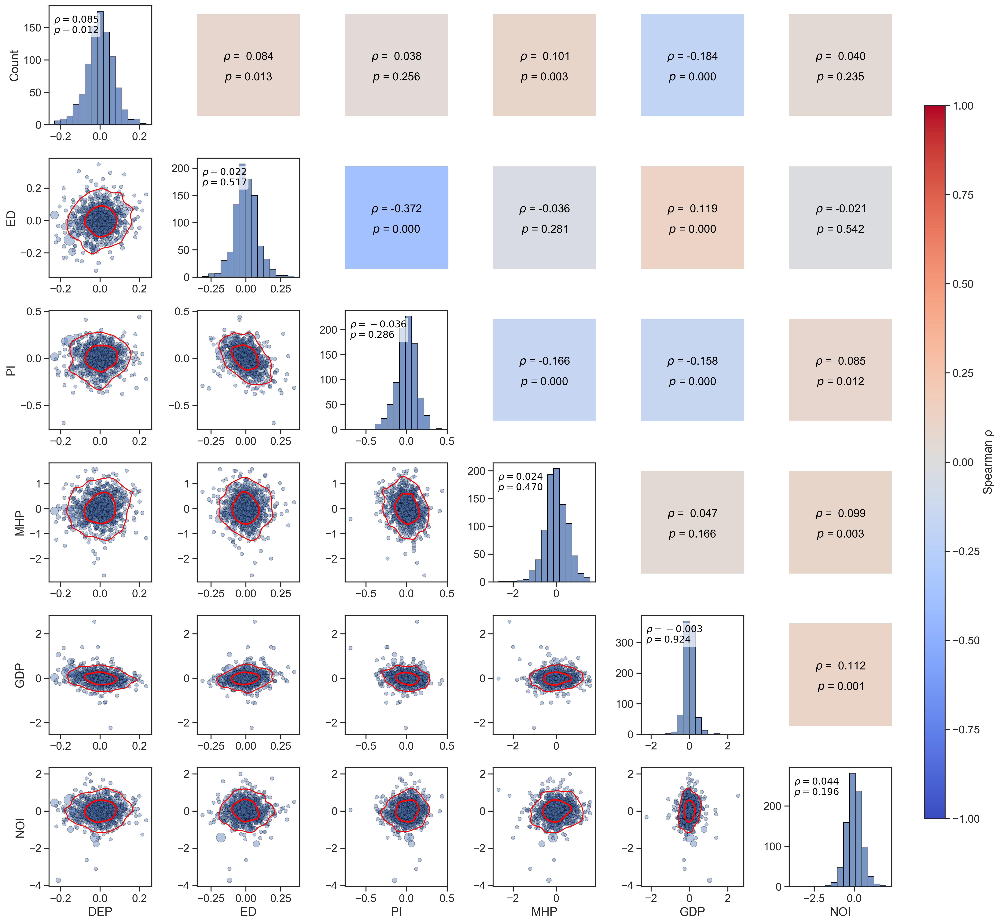

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from scipy.stats import spearmanr, gaussian_kde

# --- INPUTS ---
# df_plot: DataFrame with ['TotalPopulation'] + factor_cols
# factor_cols: e.g., ["DEP","ED","PI","MHP","GDP","NOI"]

sns.set_theme(style="ticks", font_scale=1.25)
plt.rc("font", family="Arial")
plt.rcParams.update({"figure.dpi": 300})

# --- Scale point size by population ---
pop = df_plot["TotalPopulation"].astype(float)
pop_norm = (pop - pop.min()) / (pop.max() - pop.min() + 1e-12)
size_min, size_max = 20, 200   # adjust here
sizes_all = size_min + pop_norm * (size_max - size_min)

# --- Compute per-variable limits (for consistent scale per factor) ---
pad_frac = 0.06
var_stats = {}
for v in factor_cols:
    a = df_plot[v].to_numpy()
    m = np.isfinite(a)
    vmin, vmax = np.min(a[m]), np.max(a[m])
    span = vmax - vmin if vmax > vmin else 1.0
    pad = span * pad_frac
    var_stats[v] = dict(min=vmin - pad, max=vmax + pad, span=span, ctr=0.5 * (vmin + vmax))

# --- Modified equal_span_limits (use each variable’s own consistent range) ---
def equal_span_limits(vx, vy):
    """Return limits based only on each variable's fixed min/max range."""
    return (var_stats[vx]["min"], var_stats[vx]["max"]), (var_stats[vy]["min"], var_stats[vy]["max"])

# --- Helper: red density contours ---
def draw_quantile_contours(ax, x, y, xlim, ylim, quantiles=(0.5, 0.9), gridsize=200):
    m = np.isfinite(x) & np.isfinite(y)
    if m.sum() < 10:
        return
    x, y = x[m], y[m]
    kde = gaussian_kde(np.vstack([x, y]))
    xi = np.linspace(xlim[0], xlim[1], gridsize)
    yi = np.linspace(ylim[0], ylim[1], gridsize)
    xx, yy = np.meshgrid(xi, yi)
    zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(gridsize, gridsize)
    dx = (xlim[1] - xlim[0]) / (gridsize - 1)
    dy = (ylim[1] - ylim[0]) / (gridsize - 1)
    area = dx * dy
    z_sorted = np.sort(zz.ravel())[::-1]
    cumsum = np.cumsum(z_sorted * area)

    def level_at(q):
        idx = np.searchsorted(cumsum, q, side="left")
        return z_sorted[min(idx, len(z_sorted) - 1)]

    levels = [level_at(q) for q in quantiles]
    cs = ax.contour(xx, yy, zz, levels=levels[::-1],
                    colors="red", linewidths=[1.2, 2.0][:len(levels[::-1])])
    for c in cs.collections:
        c.set_zorder(3)

# --- Layout ---
n = len(factor_cols)
cell = 2.6
fig, axes = plt.subplots(n, n, figsize=(cell * n + 2.2, cell * n + 0.9))
plt.subplots_adjust(wspace=0.28, hspace=0.28)

# --- Spearman color map ---
cmap = plt.get_cmap("coolwarm")
norm = Normalize(vmin=-1, vmax=1)
sm = ScalarMappable(norm=norm, cmap=cmap)

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        xi, yi = factor_cols[j], factor_cols[i]

        if i == j:
            # Diagonal histogram
            sns.histplot(df_plot[yi], bins=15, edgecolor="black", linewidth=0.5, ax=ax)
            ax.set_xlim(var_stats[yi]["min"], var_stats[yi]["max"])
            ax.grid(False)
            ax.set_xlabel(yi if i == n - 1 else "")
            ax.set_ylabel("Count" if j == 0 else "")

            fac = xi
            rho, p = stat_map.get(fac, (None, None))
            if rho is not None:
                line1 = rf"$\rho={rho:.3f}$"
                line2 = rf"$p={p:.3f}$" if p is not None else ""
                ax.text(
                    0.05, 0.92,
                    f"{line1}\n{line2}",   
                    transform=ax.transAxes,
                    ha="left", va="top",
                    fontsize=12, color="black",
                    linespacing=1.1,
                    bbox=dict(boxstyle="round,pad=0.2", facecolor="white",
                            alpha=0.7, edgecolor="none"),
                )

        elif i > j:
            # Lower triangle: population-scaled scatter + KDE contours
            x = df_plot[xi].to_numpy()
            y = df_plot[yi].to_numpy()
            m = np.isfinite(x) & np.isfinite(y)
            x, y, s = x[m], y[m], sizes_all[m]

            xlim, ylim = equal_span_limits(xi, yi)
            ax.set_xlim(*xlim)
            ax.set_ylim(*ylim)

            ax.scatter(x, y, s=s, alpha=0.4, edgecolor="black", linewidths=0.5)
            draw_quantile_contours(ax, x, y, xlim, ylim, quantiles=(0.5, 0.9), gridsize=220)

            ax.grid(False)
            ax.set_xlabel(xi if i == n - 1 else "")
            ax.set_ylabel(yi if j == 0 else "")

        else:
            # Upper triangle: Spearman correlation tile
            x = df_plot[xi].to_numpy()
            y = df_plot[yi].to_numpy()
            m = np.isfinite(x) & np.isfinite(y)
            rho, p = spearmanr(x[m], y[m], nan_policy="omit")

            ax.imshow([[rho]], extent=[0, 1, 0, 1], cmap=cmap, norm=norm, aspect="equal")
            ax.text(0.5, 0.58, rf"$\rho$ = {rho: .3f}", ha="center", va="center",
                    fontsize=14, color="black", transform=ax.transAxes)
            ax.text(0.5, 0.38, rf"$p$ = {p:.3f}", ha="center", va="center",
                    fontsize=14, color="black", transform=ax.transAxes)
            ax.set_xticks([]); ax.set_yticks([])
            for s in ax.spines.values():
                s.set_visible(False)
            if i == n - 1: ax.set_xlabel(xi)
            if j == 0: ax.set_ylabel(yi)

# --- Colorbar ---
cax = fig.add_axes([0.92, 0.12, 0.02, 0.76])
cb = fig.colorbar(sm, cax=cax)
cb.set_label("Spearman ρ", rotation=90)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

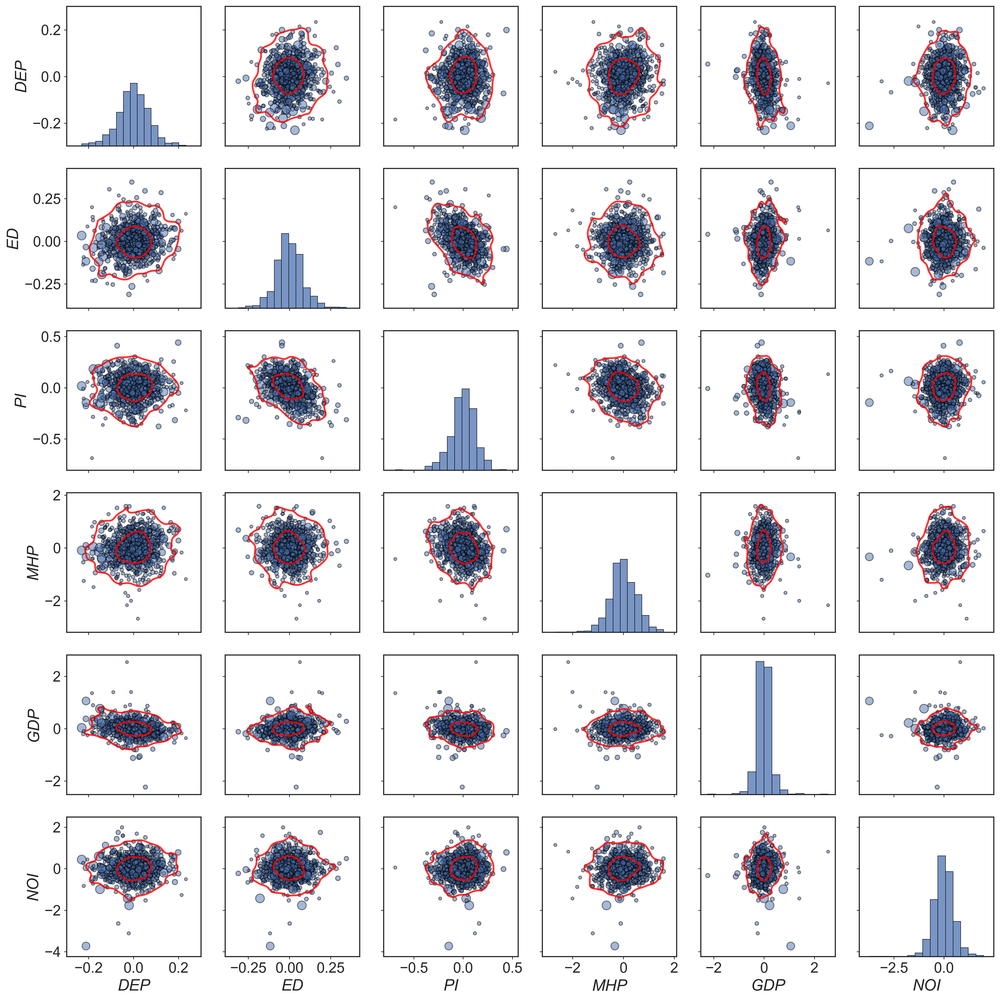

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# --- Load & tidy --------------------------------------------------------------
df = pd.read_csv('../00_data/14_output/FsAMI_results_0924.csv')

# Map long factor names to short labels (values, not column names)
factor_map = {
    'gdp': 'GDP',
    'mental_health_providers': 'MHP',
    'DEPRESSION': 'DEP',
    'noise50n': 'NOI',
    'BINGE': 'ED',
    'FFR20': 'FFR',
    'LPA': 'PI'
}
df['factor'] = df['factor'].replace(factor_map)

# Keep only selected factors
df_select = df.loc[df['factor'].isin(factors)]

# Pivot to wide: one row per CBSA with factor columns
dfp = (
    df_select
    .pivot(index="cbsacode", columns="factor", values='FsAMI')
    .reset_index()
)

# Merge population and drop NAs
# NOTE: ensure df_raw has ('cbsacode','TotalPopulation')
df_cleaned = (
    dfp
    .merge(df_raw[['cbsacode','TotalPopulation']], on='cbsacode', how='inner')
    .dropna(subset=factors)
)

# Data for plotting (factors + population kept for size mapping)
factor_cols = factors
df_plot = df_cleaned[['TotalPopulation'] + factor_cols].copy()

# --- Style --------------------------------------------------------------------
sns.set_theme(style="ticks", font_scale=1.5)
plt.rc("font", family="Arial")
plt.rcParams.update({
    "figure.dpi": 300
})

# --- Marker size mapping (area in points^2) -----------------------------------
pop = df_plot['TotalPopulation']

# Clip extremes and use sqrt scaling for perceptual balance
pop_clip = pop.clip(upper=pop.quantile(0.98))
s_min, s_max = 10, 100  # adjust if you want bigger/smaller bubbles
pop_sqrt = np.sqrt(pop_clip)
sizes_all = s_min + (pop_sqrt - pop_sqrt.min()) / (pop_sqrt.max() - pop_sqrt.min()) * (s_max - s_min)
sizes_all = sizes_all.astype(float)

# --- PairGrid with custom scatter --------------------------------------------
g = sns.PairGrid(df_plot, vars=factor_cols, height=2.7, corner=False, despine=False)

def scatter_pop(x, y, color=None, **kwargs):
    ax = plt.gca()
    # Align sizes to the subset of rows used in this panel
    s = sizes_all.loc[x.index]
    ax.scatter(x, y, s=s, alpha=0.5, edgecolors='black')
    sns.kdeplot(
        x=x, y=y,
        levels=3,  # number of contour rings
        color="red",
        linewidths=2.0,
        alpha=0.8,
        fill=False,
        ax=ax
    )

g.map_offdiag(scatter_pop)
g.map_diag(sns.histplot, bins=15, edgecolor='black', linewidth=0.5)

# Ticks & labels
for ax in g.axes.flatten():
    if ax is not None:
        ax.tick_params(axis='both', which='both', length=3, width=0.8)
        xlabel = ax.get_xlabel()
        ylabel = ax.get_ylabel()
        if xlabel:
            ax.set_xlabel(xlabel, fontstyle="italic")
        if ylabel:
            ax.set_ylabel(ylabel, fontstyle="italic")
            
# Title & layout
g.fig.tight_layout()
plt.show()

## Moran's I

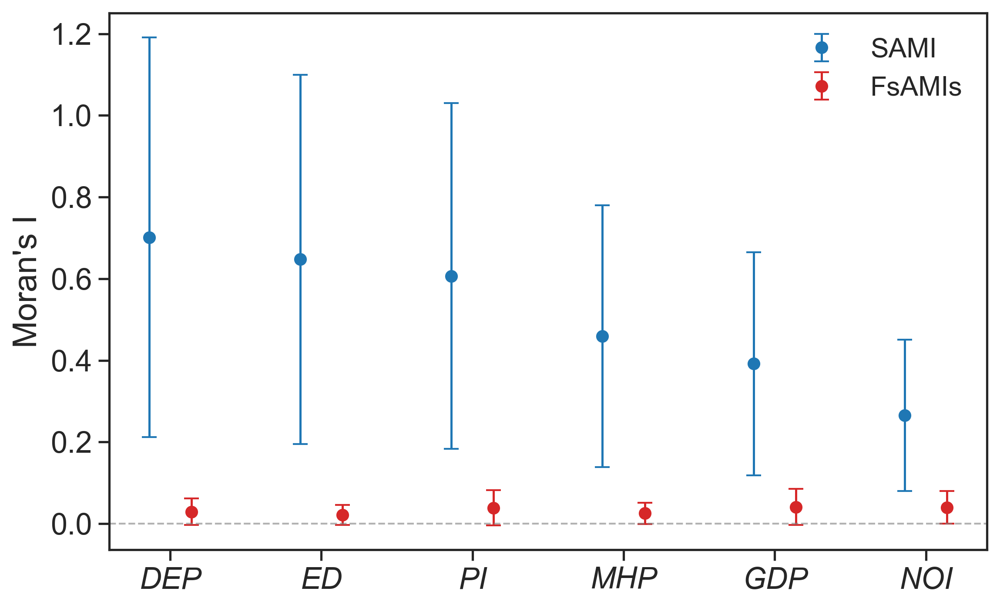

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm

df = pd.read_csv('../00_data/14_output/FsAMIs_0903_pop_ko.csv')

df.loc[df['factor'] == 'gdp', 'factor'] = 'GDP'
df.loc[df['factor'] == 'mental_health_providers', 'factor'] = 'MHP'
df.loc[df['factor'] == 'DEPRESSION', 'factor'] = 'DEP'
df.loc[df['factor'] == 'noise50n', 'factor'] = 'NOI'
df.loc[df['factor'] == 'BINGE', 'factor'] = 'ED'
df.loc[df['factor'] == 'FFR20', 'factor'] = 'FFR'
df.loc[df['factor'] == 'LPA', 'factor'] = 'PI'

df_models = df.loc[df['factor'].isin(factors)].drop(columns=['FsAMI','cbsacode']).drop_duplicates().reset_index(drop=True)


df_plot = df_models.loc[df_models['factor'].isin(factors)].copy()
df_plot['factor'] = pd.Categorical(df_plot['factor'], categories=factors, ordered=True)
df_plot = df_plot.sort_values('factor')

# Derive 95% CI half-widths from p-values (two-sided normal approx around 0)
def ci_half_from_p(value, p, alpha=0.05):
    if pd.isna(value) or pd.isna(p) or p <= 0:
        p = 1e-16  # avoid inf
    z_obs = norm.isf(p/2.0)          # z such that P(|Z|>=z)=p
    se    = abs(value) / z_obs       # value ≈ z_obs * se  (testing against 0)
    z95   = norm.ppf(1 - alpha/2.0)  # 1.96
    return z95 * se

df_plot['baseline_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['baseline_moran_value'], r['baseline_moran_p']), axis=1
)
df_plot['final_ci'] = df_plot.apply(
    lambda r: ci_half_from_p(r['final_moran_value'], r['final_moran_p']), axis=1
)

# ---- PLOT ----
sns.set_theme(style="ticks", font_scale=1.5)
fig, ax = plt.subplots(figsize=(8, 5))

x = np.arange(len(factors))
width = 0.28

ax.errorbar(
    x - width/2,
    df_plot['baseline_moran_value'],
    yerr=df_plot['baseline_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="SAMI", color='tab:blue'
)
ax.errorbar(
    x + width/2,
    df_plot['final_moran_value'],
    yerr=df_plot['final_ci'],
    fmt='o', capsize=4, elinewidth=1.2, linewidth=0,
    label="FsAMIs", color='tab:red'
)

# zero reference
ax.axhline(0, color='gray', linewidth=1, linestyle='--', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(factors, fontstyle="italic")
ax.set_ylabel("Moran's I")
ax.legend(loc="upper right", frameon=False, fontsize=15) 
plt.tight_layout()
plt.show()

In [8]:
df_models

,factor,best_k,baseline_moran_value,baseline_moran_p,final_moran_value,final_moran_p,selected_m_eigs,beta,p_value,CI_lower,CI_upper,AIC
0,ED,12,0.647656,0.005,0.021401,0.083,42,1.019515,0.0,1.014879,1.024150,-1833.959834
1,DEP,9,0.701234,0.005,0.029164,0.079,66,0.993780,0.0,0.989925,0.997635,-2188.492209
2,PI,5,0.606606,0.005,0.038697,0.079,52,0.957922,0.0,0.951126,0.964718,-1196.830248
3,MHP,11,0.459386,0.005,0.025334,0.058,34,1.151497,0.0,1.123054,1.179941,1346.769538
4,GDP,5,0.391563,0.005,0.040877,0.071,28,1.086026,0.0,1.070358,1.101695,302.950580
5,NOI,6,0.265583,0.005,0.039752,0.050,22,1.211661,0.0,1.182870,1.240452,1396.456897
